In this notebook we will look at satellite imagery data from Masachusetts and detect roads from the images. 

- The dataset has been obtained from  [kaggle](https://www.kaggle.com/insaff/massachusetts-roads-dataset)

- The data is organized as follows: 

```
.
└── training
    ├── input
    └── output
├── testing
│   ├── input
│   └── output

```
where input folder contains the images and output folder contains the corresponding mask images. 

- The size of the images is: <br/>
(length, width, color_channels) = (1500, 1500, 3) 

- The two tasks in the analysis are:
  - Data Pipeline:  Preprocessing the raw images to make them ready for the deep learning model
  - Deep Learning model: Build a deep learning model to identify roads from the images

- Data pipeline has accomplished the following steps: 
  - Crop input images from (1500, 1500, 3) into multiple smaller images of size (256, 256, 3) 
  - Apply similar operation on the mask images 
  - Save images as h5 files. 

- This notebook will focus on the Deep Learning model building with data inputs being the h5 images and masks from the data pipeline done in a different notebook.   



In [ ]:
#https://github.com/Nirzaree/Detecting-Roads-from-Satellite-Images

### Setup

In [6]:
!pip install git+https://github.com/qubvel/segmentation_models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-tu2_c5qt
  Running command git clone -q https://github.com/qubvel/segmentation_models /tmp/pip-req-build-tu2_c5qt
  Running command git submodule update --init --recursive -q
     |████████████████████████████████| 50 kB 2.8 MB/s 
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33810 sha256=0f7b357306f069c21efb74361706fc5b7e4eb499415505ca6dc8af455648aa99
  Stored in directory: /tmp/pip-ephem-wheel-cache-rl2b44r5/wheels/02/cd/18/61c0bbb8766acfec68f9d20618886b7b38dfeeb95865b6ba00
Successfully built segmentation-models


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import numpy as np
import matplotlib.pyplot as plt 
import cv2
from google.colab.patches import cv2_imshow
import os
import h5py

from sklearn.model_selection import train_test_split

In [8]:
seed = 42

### Load Data

For the model training we are loading a subset (2000 images) of the complete dataset (which is ~21000 images), since larger training size requires more RAM than is available in the Colab Basic version, leading to training session crashing. 

In [ ]:
#images = '/content/drive/MyDrive/training/input'
#masks = '/content/drive/MyDrive/training/output'



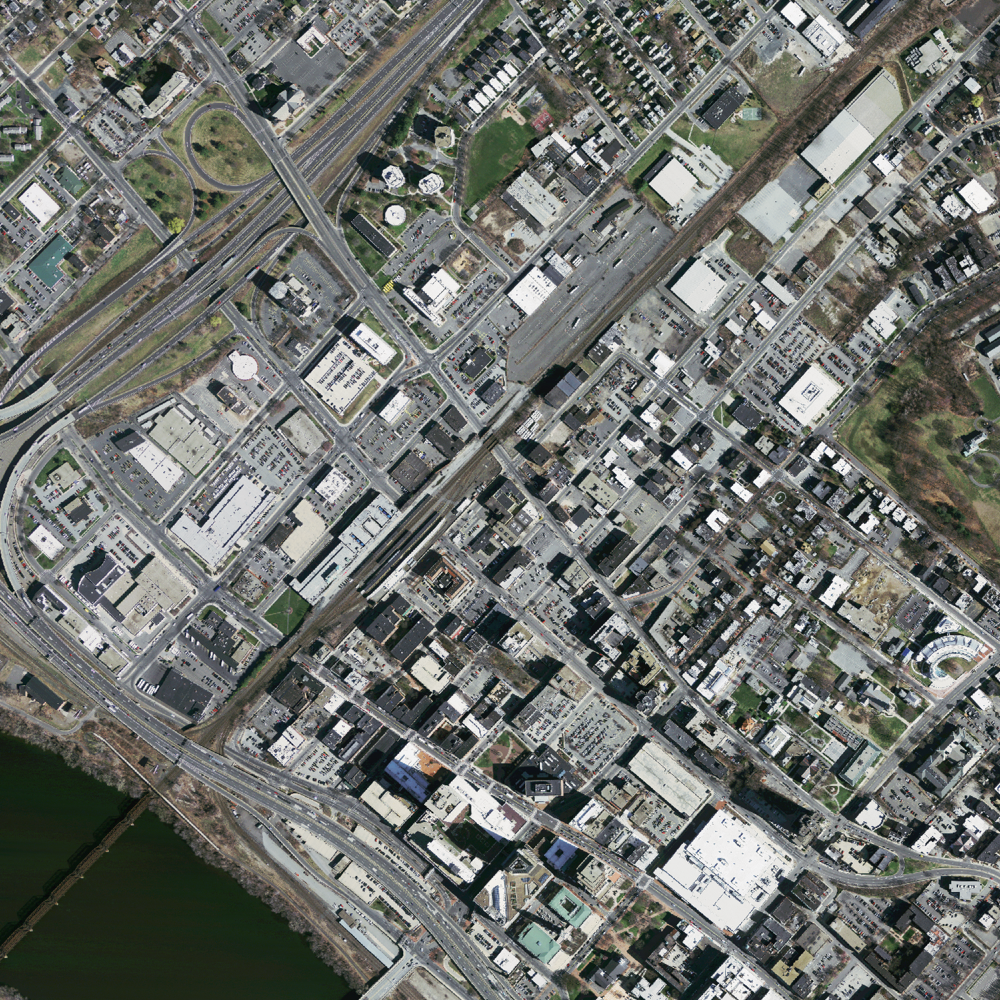

(1500, 1500, 3)


In [ ]:
'''
ind = 'img-1.png'

path = os.path.join(images, ind)
path_mask = os.path.join(masks, ind)
image = cv2.imread(path)
image = cv2.resize(image, (500, 500), interpolation=cv2.INTER_AREA)
cv2_imshow(image)
print(image.shape)
'''

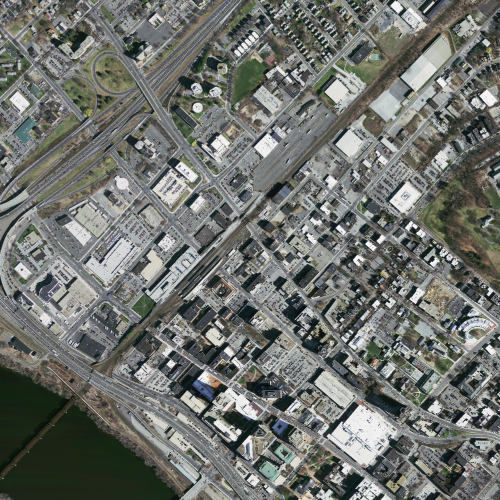

In [ ]:
#image = cv2.resize(image, (500, 500), interpolation=cv2.INTER_AREA)
#cv2_imshow(image)

In [ ]:
#path

'/content/drive/MyDrive/road_segmentation_ideal/testing/input/img-1.png'

In [ ]:
#path_mask

NameError: ignored

### Explore Data

### Plot few masks and images

In [ ]:
#images = '/content/drive/MyDrive/training/input'
#masks = '/content/drive/MyDrive/training/output'

## Split data

In [ ]:
data = '/content/drive/MyDrive/archive/train'

In [ ]:
#Pre-processing, convert images to matrices/tensor
train_inp = []
train_masks = []
for i in range(170000):
  ind = str((i)) + "_sat" + ".png"
  ind_again = str((i)) + "_sat" + ".jpg"
  path = os.path.join(data, ind)
  img = cv2.imread(path)
  try:
    img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_AREA)
  except:
    try:
      path = os.path.join(data, ind_again)
      img = cv2.imread(path)
      img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_AREA)
    except:
      continue
  ind2 = str((i)) + "_mask" + ".png"
  path2 = os.path.join(data, ind2)
  mask_img = cv2.imread(path2)
  #print(mask_img)
  #if mask_img == None:
    #continue
  try:
    mask_img = cv2.resize(mask_img, (256, 256), interpolation=cv2.INTER_AREA)
    mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
  except:
    continue

  train_inp.append(img)
  train_masks.append(mask_img)

images = np.array(train_inp)
masks = np.array(train_masks)
print(images.shape)
print(masks.shape)

#700000 iterations to 1h 30, GPU should be fine, but would need higher RAM for that, 
#Can just train multiple times on different parts of the dataset

#170000 iterations took 10 minutes, 1000 images

In [ ]:
masks = np.expand_dims(masks, -1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    images,
    masks,
    test_size = 0.2,
    random_state = seed
)

In [ ]:
#del images,masks

In [ ]:
print("Training Dataset: ")
print("number of samples = ",X_train.shape[0])
print("shape of images = ",X_train.shape)
print("shape of masks = ",y_train.shape)
print("Test Dataset: ")
print("number of samples = ",X_test.shape[0])
print("shape of images = ",X_test.shape)
print("shape of masks = ",y_test.shape)

Training Dataset: 
number of samples =  849
shape of images =  (849, 256, 256, 3)
shape of masks =  (849, 256, 256, 1)
Test Dataset: 
number of samples =  213
shape of images =  (213, 256, 256, 3)
shape of masks =  (213, 256, 256, 1)


## Define Model

In [9]:
from segmentation_models import Unet
import segmentation_models as sm

sm.set_framework('tf.keras')
sm.framework()

Segmentation Models: using `keras` framework.


'tf.keras'

In [10]:
model = Unet(
    backbone_name = 'efficientnetb0',
    encoder_weights = 'imagenet',
    encoder_freeze = False
)

16804768/16804768 [==============================] - 0s 0us/step


### Define custom loss metric and accuracy metric

In [11]:
#Source: https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2
from keras import backend as K
def iou_coef(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
  union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  
  return iou

In [12]:
def dice_coef(y_true, y_pred, smooth = 1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def soft_dice_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

#### Hyperparameters

In [ ]:
EPOCHS = 70
LEARNING_RATE = 0.0001
BATCH_SIZE = 16

#### Define callbacks

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

In [ ]:
model_path = './Models/modelRural.h5'

modelcheckpoint = ModelCheckpoint(
    filepath = model_path,
    monitor = "val_loss",
    mode = "min",
    save_best_only = True,
    verbose = 1
)

earlystopping = EarlyStopping(
    monitor = "val_loss",
    min_delta = 0,
    patience = 5,
    verbose = 1,
    restore_best_weights = True 
)

reduceLR = ReduceLROnPlateau(
    monitor = "val_loss",
    factor = 0.1,
    patience = 5,
    verbose = 1,
    min_delta = 1e-4 
)

#### Compile model

In [ ]:
model.compile(
    optimizer = Adam(learning_rate = LEARNING_RATE),
    loss = soft_dice_loss,
    metrics = [iou_coef]
)

In [ ]:
X_train.shape

(849, 256, 256, 3)

In [ ]:
tst = (y_train/255)
tst.shape

(849, 256, 256, 1)

### Train model

In [ ]:
history = model.fit(
    X_train,
    y_train/255,
    validation_data = (X_test,y_test/255),
    batch_size = BATCH_SIZE,
    epochs = EPOCHS,
    callbacks = [modelcheckpoint, earlystopping, reduceLR]
)
#Runtime can crash if too much RAM, trained on 849 images

Epoch 1/70
54/54 [==============================] - ETA: 0s - loss: 0.8904 - iou_coef: 0.0531
Epoch 1: val_loss improved from inf to 0.86699, saving model to ./Models/modelRural.h5
54/54 [==============================] - 32s 432ms/step - loss: 0.8904 - iou_coef: 0.0531 - val_loss: 0.8670 - val_iou_coef: 0.0674 - lr: 1.0000e-04
Epoch 2/70
54/54 [==============================] - ETA: 0s - loss: 0.8112 - iou_coef: 0.0899
Epoch 2: val_loss improved from 0.86699 to 0.80830, saving model to ./Models/modelRural.h5
54/54 [==============================] - 19s 347ms/step - loss: 0.8112 - iou_coef: 0.0899 - val_loss: 0.8083 - val_iou_coef: 0.0945 - lr: 1.0000e-04
Epoch 3/70
54/54 [==============================] - ETA: 0s - loss: 0.7568 - iou_coef: 0.1201
Epoch 3: val_loss improved from 0.80830 to 0.78040, saving model to ./Models/modelRural.h5
54/54 [==============================] - 19s 354ms/step - loss: 0.7568 - iou_coef: 0.1201 - val_loss: 0.7804 - val_iou_coef: 0.1081 - lr: 1.0000e-04
Ep

In [ ]:
model.save(model_path)

## Validate Model

In [3]:
from keras.models import load_model

In [ ]:
# '/content/drive/MyDrive/modelRural.h5'

In [13]:
model = load_model("./Models/modelRural.h5",
                   custom_objects = {'soft_dice_loss': soft_dice_loss, 'iou_coef': iou_coef})

OSError: ignored

In [14]:
model = load_model("/content/drive/MyDrive/modelRural.h5",
                   custom_objects = {'soft_dice_loss': soft_dice_loss, 'iou_coef': iou_coef})

In [ ]:
predictions = model.predict(X_test,verbose=1)

7/7 [==============================] - 3s 437ms/step


Run Model on Images

In [20]:
images = '/content/drive/MyDrive/ruralImages2'

In [38]:
#Pre-processing, convert images to matrices/tensor
test_inp = []

for i in range(9):
  ind = str((i)) + ".png"
  path = os.path.join(images, ind)
  img = cv2.imread(path)
  try:
    img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_AREA)
  except:
    continue
  test_inp.append(img)

test_inp = np.array(test_inp)
print(test_inp.shape)

#700000 iterations to 1h 30, GPU should be fine, but would need higher RAM for that, 
#Can just train multiple times on different parts of the dataset

#170000 iterations took 10 minutes, 1000 images

error: ignored

In [45]:
one_photo = []
img = cv2.imread('test.png')
img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_AREA)
one_photo.append(img)
one_photo = np.array(one_photo)

In [22]:
predictions2 = model.predict(test_inp,verbose=1)

1/1 [==============================] - 10s 10s/step


In [46]:
predictions3 = model.predict(one_photo,verbose=1)

1/1 [==============================] - 1s 973ms/step


In [27]:
predictions2.shape

(8, 256, 256, 1)

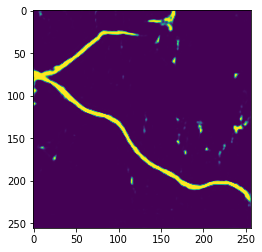

In [47]:
plt.imshow(predictions3[0].reshape(256,256))
  

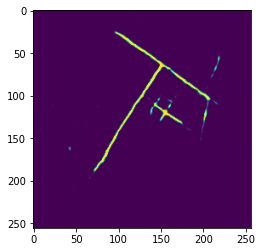

In [32]:
plt.imshow(predictions2[1].reshape(256,256))

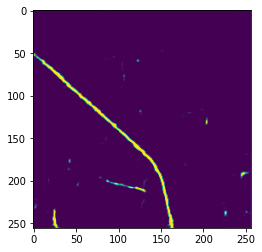

In [33]:
plt.imshow(predictions2[2].reshape(256,256))

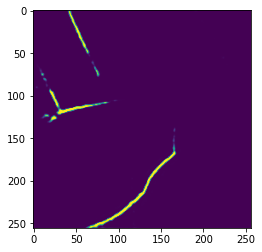

In [34]:
plt.imshow(predictions2[3].reshape(256,256))

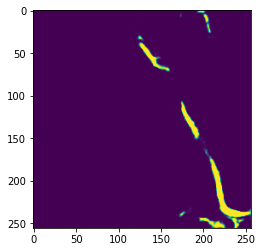

In [37]:
plt.imshow(predictions2[7].reshape(256,256))

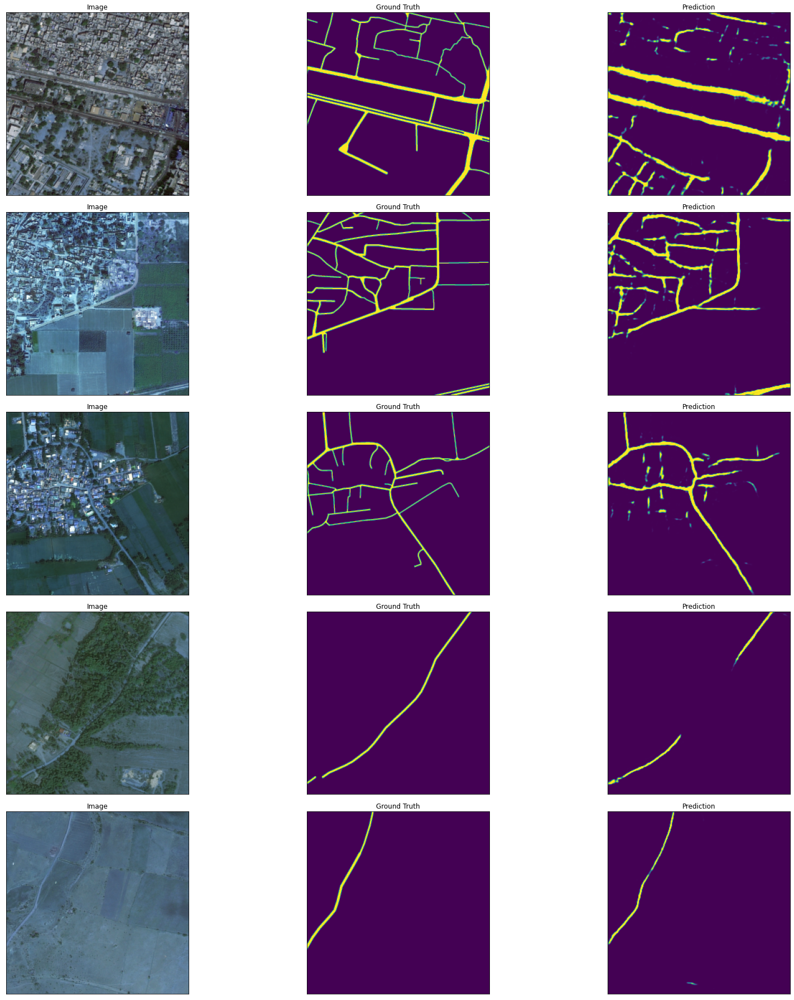

In [ ]:
cnt = 0
plt.figure(figsize = (25,25))
for ind in range(1,15):
  try:
    cnt += 1
    plt.subplot(5,3,cnt)
    plt.imshow(X_test[ind])
    plt.xticks([])
    plt.yticks([])
    plt.title('Image')

    cnt += 1
    plt.subplot(5,3,cnt)
    plt.imshow(y_test[ind].reshape(256,256))
    plt.xticks([])
    plt.yticks([])
    plt.title('Ground Truth')

    cnt += 1  
    plt.subplot(5,3,cnt)
    plt.imshow(predictions[ind].reshape(256,256))
    plt.xticks([])
    plt.yticks([])
    plt.title('Prediction')
  except:
    continue
plt.tight_layout()

### Summary

- In this report, we built a UNet Deep Learning model for segmenting aerial images of Masachusetts to identify roads from the images. 

- Due to RAM constraints, the model was built with a small fraction (2000 images) of the total training data (~21000 images) however the predictions of the model are still quite good on the test images. 

- Further work on the model front can be along the following lines:
  - Training the model on the entire training dataset
  - Transforming input images (rotation, scaling, translation) to add more diversity to the training dataset 
  - Configuring various parameters of the Unet model